In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import os
import tensorflow as tf
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Embedding, Dense,LSTM,Input
from tensorflow.keras.models import Model
from keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.callbacks import ModelCheckpoint
import cv2
import matplotlib.pyplot as plt
import csv
import pickle
import string
from collections import Counter
import csv

2025-04-23 01:45:24.893484: I tensorflow/core/util/port.cc:153] oneDNN custom operations are on. You may see slightly different numerical results due to floating-point round-off errors from different computation orders. To turn them off, set the environment variable `TF_ENABLE_ONEDNN_OPTS=0`.
2025-04-23 01:45:24.995398: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:467] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1745365525.058402    5654 cuda_dnn.cc:8579] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1745365525.074684    5654 cuda_blas.cc:1407] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered
W0000 00:00:1745365525.162135    5654 computation_placer.cc:177] computation placer already registered. Please check linkage and avoid linking 

In [2]:
#Feeds the images into a RESNET Model to get the feature vector , saved in a .pkl file
def compute_feature_vector(folder,output_name):
    RESmodel = ResNet50(weights='imagenet', include_top=False, pooling='avg')
    RESmodel.trainable = False

    folder_path = folder
    features_dict = {}
    batch_size = 32  # Process images in batches for better efficiency
    img_paths = []

    # First collect all valid image paths
    for img_name in os.listdir(folder_path):
        img_path = os.path.join(folder_path, img_name)
        if os.path.isfile(img_path):
            try:
                # Verify the file is an image
                img = image.load_img(img_path, target_size=(224, 224))
                img_paths.append(img_path)
            except Exception as e:
                print(f"Skipping {img_name}: {e}")

    # Process images in batches
    for i in range(0, len(img_paths), batch_size):
        batch_paths = img_paths[i:i+batch_size]
        batch_images = []
        
        for img_path in batch_paths:
            try:
                img = image.load_img(img_path, target_size=(224, 224))
                x = image.img_to_array(img)
                batch_images.append(x)
            except Exception as e:
                print(f"Error loading {img_path}: {e}")
                continue
        
        if batch_images:
            x = np.array(batch_images)
            x = preprocess_input(x)
            features = RESmodel.predict(x)
            
            # Store features with their corresponding filenames
            for img_path, feature in zip(batch_paths, features):
                img_name = os.path.basename(img_path)
                features_dict[img_name] = feature.flatten()

    # Save features
    with open(output_name, "wb") as f:
       return pickle.dump(features_dict, f)    

In [3]:
def clean_captions(filepath,outputfile):
    data={}
    with open(filepath, mode='r') as file:
        for line in file:
            l=line.split('\t')
            img_name=l[0]
            caption=l[1].lower().strip().translate(str.maketrans('', '', string.punctuation))
            caption=f"<start> {caption} <end>"
            caption=caption.split()
            if img_name in data:
                data[img_name].append(caption)
            else:
                data[img_name]=[caption]           

    with open(outputfile, 'wb') as f:
        pickle.dump(data, f)
    data.clear()
    del data

def get_word_count(filepath):
    word_count = Counter()
    with open(filepath, 'rb') as f:
        captions = pickle.load(f)  # Removed quotes around filepath
        for _,arr in captions.items():
            for a in arr:
                word_count.update(a)            
    return word_count      

def process_captions(word_count):
    special_tokens = ['<pad>', '<start>', '<end>', '<unk>']
    word2idx = {tok: idx for idx, tok in enumerate(special_tokens)}
    next_idx = len(word2idx)
    vocab = sorted([word for word, count in word_count.items() if count >= 5 and word not in special_tokens])
    for word in vocab:
        word2idx[word] = next_idx
        next_idx += 1
    idx2word={idx:word for word,idx in word2idx.items()}
   
    return vocab , word2idx , idx2word

def sequence_captions(filepath,outputfile,word2idx):
    seq={}
    with open(filepath, 'rb') as f:  # 'rb' = read binary mode
        data = pickle.load(f)
        for key in list(data.keys()):
            seqs=[]
            captions=data[key]
            for caption in captions:
                sequence=[word2idx.get(word,word2idx['<unk>']) for word in caption]
                if len(sequence) < 20:
                    sequence = sequence + [word2idx['<pad>']] * (20 - len(sequence))
                elif len(sequence) > 20:

                    sequence = sequence[:19] + [word2idx['<end>']]

                seqs.append(sequence)     

            seq[key]=seqs   


    with open(outputfile, 'wb') as f:
        pickle.dump(seq, f)
    

In [4]:
def process_model_inputs(featureVectorPath,sequencePath,max_seq_length):
    with open(featureVectorPath, 'rb') as f:
        image_features = pickle.load(f)

    with open(sequencePath, 'rb') as f:
        sequence_captions = pickle.load(f)    

    encoder_inputs = []
    decoder_inputs = []
    decoder_outputs = []


    for image_id, arr in sequence_captions.items():
        if image_id=='image':
            continue
        image_feature = image_features[image_id]
        for seq in arr:
            decoder_input = seq[:-1]
            decoder_output = seq[1:]

            # Pad sequences to fixed length
            decoder_input += [0] * (max_seq_length - len(decoder_input))
            decoder_output += [0] * (max_seq_length - len(decoder_output))


            encoder_inputs.append(image_feature)
            decoder_inputs.append(decoder_input)
            decoder_outputs.append(decoder_output)

    encoder_inputs = np.array(encoder_inputs)  # shape: (num_samples, 2048)
    decoder_inputs = np.array(decoder_inputs)  # shape: (num_samples, max_seq_length)
    decoder_outputs = np.expand_dims(np.array(decoder_outputs), -1).astype('int32')


    return encoder_inputs,decoder_inputs,decoder_outputs

def create_model(vocab_size,max_seq_length,embedding_dim,lstm_units):
    # --- Encoder (Pre-computed features) ---
    # Input: ResNet50 features (shape: [2048])
    encoder_input = Input(shape=(2048,), name='image_features')

    # Project features to LSTM initial state
    initial_h = Dense(lstm_units, activation='tanh', name="init_h")(encoder_input)
    initial_c = Dense(lstm_units, activation='tanh', name="init_c")(encoder_input)


    # --- Decoder (LSTM) ---
    # Caption input (teacher forcing)
    decoder_input = Input(shape=(max_seq_length,), name='sequence_input')

    # Embedding layer
    embedding = Embedding(vocab_size, embedding_dim,mask_zero=True)(decoder_input)

    # LSTM layer (initialized with image features)
    lstm_output = LSTM(lstm_units, return_sequences=True)(
        embedding, initial_state=[initial_h, initial_c]
    )
    # Output layer (vocab probabilities)
    output = Dense(vocab_size, activation='softmax')(lstm_output)

    # --- Full Model ---
    model = Model(inputs=[encoder_input, decoder_input], outputs=output)
    model.compile(optimizer=Adam(learning_rate=1e-4), loss='sparse_categorical_crossentropy')

    print(model.summary())

    return model

def train_model(model,epochs,patience,encoder_inputs,decoder_inputs,decoder_outputs,val_encoder_inputs,val_decoder_inputs,val_decoder_outputs):
    early_stopping = EarlyStopping(
        monitor='val_loss',
        patience=patience,  # stop if no improvement after 10 epochs
        restore_best_weights=True
    )

    checkpoint = ModelCheckpoint(
        'model_best.h5',
        monitor='val_loss',
        save_best_only=True,
        verbose=1
    )


    model.fit(
        [encoder_inputs, decoder_inputs],
        decoder_outputs,
        validation_data=(
        [val_encoder_inputs, val_decoder_inputs],
        val_decoder_outputs
    ),
        epochs=epochs,
        batch_size=64,
        shuffle=True,
        callbacks=[early_stopping, checkpoint]
    )


In [5]:
def compute_caption(model,feature_vector,word2idx,idx2word):

    feature_vector = np.expand_dims(feature_vector, axis=0)  # shape (1, 2048)

    start_token = word2idx['<start>']
    end_token = word2idx['<end>']
    pad_token = word2idx['<pad>']

    caption_seq = [start_token]

    for i in range(20):
        input_seq = caption_seq + [pad_token] * (20 - len(caption_seq))
        input_seq = np.array([input_seq])

        preds = model.predict([feature_vector, input_seq], verbose=0)
        next_word_id = np.argmax(preds[0, len(caption_seq) - 1])
        
        caption_seq.append(next_word_id)

        if next_word_id == end_token:
            break

    words = [idx2word.get(idx, '<unk>') for idx in caption_seq]
    ret=' '.join(words)
    return ret

def show_image_with_caption(image_path, caption):
    img = cv2.imread(image_path)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    plt.figure(figsize=(8, 6))
    plt.imshow(img)
    plt.axis('off')
    plt.title(caption, fontsize=14)
    plt.show()

def compute_kaggle_preds(model,word2idx,idx2word):
    predictions={}

    with open('test_feature_vector.pkl', 'rb') as f:
        test_feature = pickle.load(f)

    for img , fv in test_feature.items():
        caption=compute_caption(model,fv,word2idx,idx2word)
        predictions[img]=caption


    df = pd.DataFrame(list(predictions.items()))


    df.to_csv("submission.csv", index=False)  

In [6]:
compute_feature_vector('Data/train/train','train_feature_vector.pkl')
compute_feature_vector('Data/test/test','test_feature_vector.pkl')
compute_feature_vector('Data/val/val','val_feature_vector.pkl')


I0000 00:00:1745365541.728391    5654 gpu_device.cc:2019] Created device /job:localhost/replica:0/task:0/device:GPU:0 with 4146 MB memory:  -> device: 0, name: NVIDIA GeForce RTX 4050 Laptop GPU, pci bus id: 0000:64:00.0, compute capability: 8.9
I0000 00:00:1745365551.452069   27085 service.cc:152] XLA service 0x7f62f00495d0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1745365551.452094   27085 service.cc:160]   StreamExecutor device (0): NVIDIA GeForce RTX 4050 Laptop GPU, Compute Capability 8.9
2025-04-23 01:45:51.490885: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
I0000 00:00:1745365551.794494   27085 cuda_dnn.cc:529] Loaded cuDNN version 90300


1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step


I0000 00:00:1745365555.027554   27085 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 110ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 108ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 107ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 106ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 76ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/st

In [7]:
clean_captions(filepath='Data/train.txt',outputfile='train_captions.pkl')
clean_captions(filepath='Data/val.txt',outputfile='val_captions.pkl')

train_word_count=get_word_count(filepath='train_captions.pkl')


In [8]:
vocab,word2idx,idx2word=process_captions(word_count=train_word_count)

In [9]:
sequence_captions(filepath='train_captions.pkl',outputfile='train_sequence.pkl',word2idx=word2idx)
sequence_captions(filepath='val_captions.pkl',outputfile='val_sequence.pkl',word2idx=word2idx)

In [10]:
vocab_size=len(word2idx)
max_seq_length=20
embedding_dim = 256
lstm_units = 1024

model=create_model(vocab_size=vocab_size,max_seq_length=max_seq_length,embedding_dim=embedding_dim,lstm_units=lstm_units)


Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ sequence_input      │ (None, 20)        │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ image_features      │ (None, 2048)      │          0 │ -                 │
│ (InputLayer)        │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ embedding           │ (None, 20, 256)   │    689,152 │ sequence_input[0… │
│ (Embedding)         │                   │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ init_h (Dense)      │ (None, 1024)      │  2,098,176 │ image_features[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ init_c (Dense)      │ (None, 1024)      │  2,098,176 │ image_features[0… │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ lstm (LSTM)         │ (None, 20, 1024)  │  5,246,976 │ embedding[0][0],  │
│                     │                   │            │ init_h[0][0],     │
│                     │                   │            │ init_c[0][0]      │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ dense (Dense)       │ (None, 20, 2692)  │  2,759,300 │ lstm[0][0]        │
└─────────────────────┴───────────────────┴────────────┴───────────────────┘

 Total params: 12,891,780 (49.18 MB)

 Trainable params: 12,891,780 (49.18 MB)

 Non-trainable params: 0 (0.00 B)

None


In [11]:
encoder_inputs,decoder_inputs,decoder_outputs=process_model_inputs(featureVectorPath='train_feature_vector.pkl',sequencePath='train_sequence.pkl',max_seq_length=max_seq_length)
val_encoder_inputs,val_decoder_inputs,val_decoder_outputs=process_model_inputs(featureVectorPath='val_feature_vector.pkl',sequencePath='val_sequence.pkl',max_seq_length=max_seq_length)

In [12]:
train_model(model=model,epochs=200,patience=20,encoder_inputs=encoder_inputs,decoder_inputs=decoder_inputs,decoder_outputs=decoder_outputs,val_encoder_inputs=val_encoder_inputs,val_decoder_inputs=val_decoder_inputs,val_decoder_outputs=val_decoder_outputs)

Epoch 1/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 5.0326
Epoch 1: val_loss improved from inf to 3.78256, saving model to model_best.h5


506/506 ━━━━━━━━━━━━━━━━━━━━ 18s 33ms/step - loss: 5.0301 - val_loss: 3.7826
Epoch 2/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 3.6365
Epoch 2: val_loss improved from 3.78256 to 3.29243, saving model to model_best.h5


506/506 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 3.6360 - val_loss: 3.2924
Epoch 3/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 3.1912
Epoch 3: val_loss improved from 3.29243 to 3.06902, saving model to model_best.h5


506/506 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 3.1909 - val_loss: 3.0690
Epoch 4/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2.9376
Epoch 4: val_loss improved from 3.06902 to 2.93836, saving model to model_best.h5


506/506 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 2.9375 - val_loss: 2.9384
Epoch 5/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2.7645
Epoch 5: val_loss improved from 2.93836 to 2.86959, saving model to model_best.h5


506/506 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 2.7644 - val_loss: 2.8696
Epoch 6/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2.6178
Epoch 6: val_loss improved from 2.86959 to 2.81005, saving model to model_best.h5


506/506 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 2.6177 - val_loss: 2.8101
Epoch 7/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2.4827
Epoch 7: val_loss improved from 2.81005 to 2.77584, saving model to model_best.h5


506/506 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 2.4827 - val_loss: 2.7758
Epoch 8/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2.3798
Epoch 8: val_loss improved from 2.77584 to 2.75050, saving model to model_best.h5


506/506 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 2.3798 - val_loss: 2.7505
Epoch 9/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2.2772
Epoch 9: val_loss improved from 2.75050 to 2.73476, saving model to model_best.h5


506/506 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 2.2772 - val_loss: 2.7348
Epoch 10/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2.1964
Epoch 10: val_loss improved from 2.73476 to 2.72145, saving model to model_best.h5


506/506 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 2.1963 - val_loss: 2.7215
Epoch 11/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2.1071
Epoch 11: val_loss did not improve from 2.72145
506/506 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 2.1071 - val_loss: 2.7216
Epoch 12/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 2.0214
Epoch 12: val_loss improved from 2.72145 to 2.71748, saving model to model_best.h5


506/506 ━━━━━━━━━━━━━━━━━━━━ 16s 33ms/step - loss: 2.0215 - val_loss: 2.7175
Epoch 13/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1.9619
Epoch 13: val_loss improved from 2.71748 to 2.71323, saving model to model_best.h5


506/506 ━━━━━━━━━━━━━━━━━━━━ 17s 33ms/step - loss: 1.9619 - val_loss: 2.7132
Epoch 14/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1.8904
Epoch 14: val_loss did not improve from 2.71323
506/506 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 1.8904 - val_loss: 2.7285
Epoch 15/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1.8268
Epoch 15: val_loss did not improve from 2.71323
506/506 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 1.8268 - val_loss: 2.7249
Epoch 16/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1.7754
Epoch 16: val_loss did not improve from 2.71323
506/506 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 1.7754 - val_loss: 2.7312
Epoch 17/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1.7141
Epoch 17: val_loss did not improve from 2.71323
506/506 ━━━━━━━━━━━━━━━━━━━━ 16s 32ms/step - loss: 1.7142 - val_loss: 2.7348
Epoch 18/200
505/506 ━━━━━━━━━━━━━━━━━━━━ 0s 31ms/step - loss: 1.6509
Epoch 18: val_loss did not improve from 2.71323
506/506 ━━━━━━━━━━━━━━━━━

In [13]:
compute_kaggle_preds(model=model,word2idx=word2idx,idx2word=idx2word)

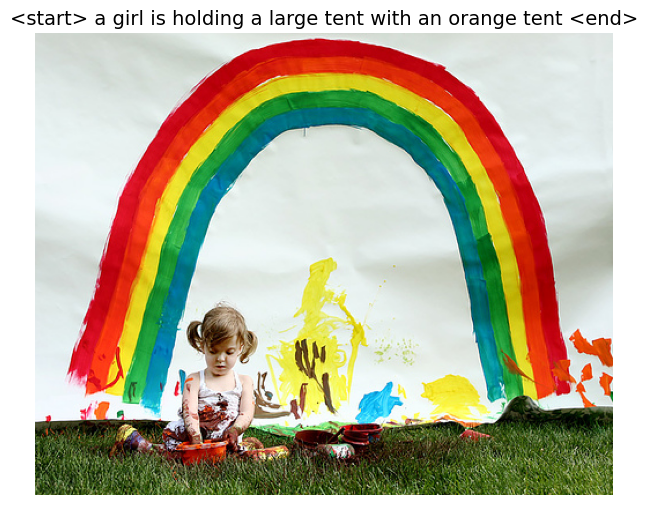

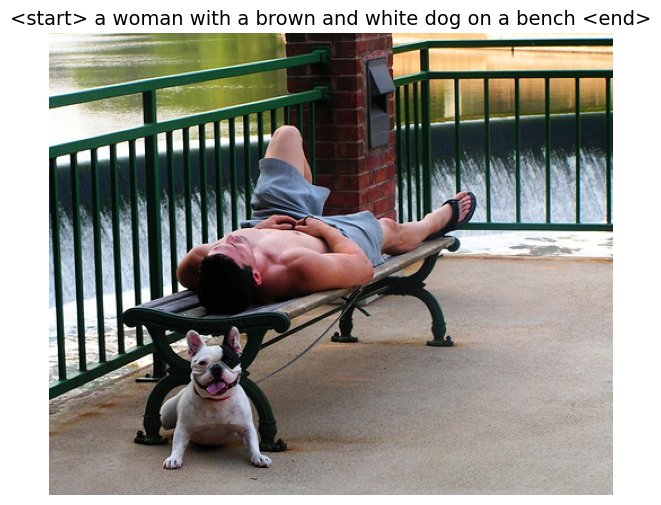

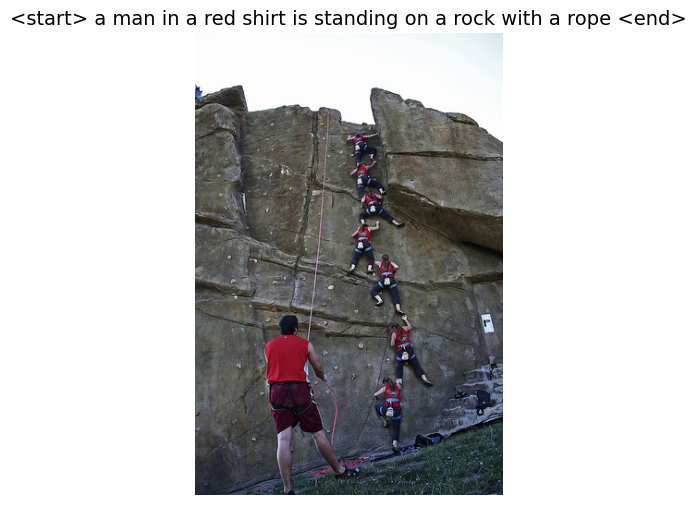

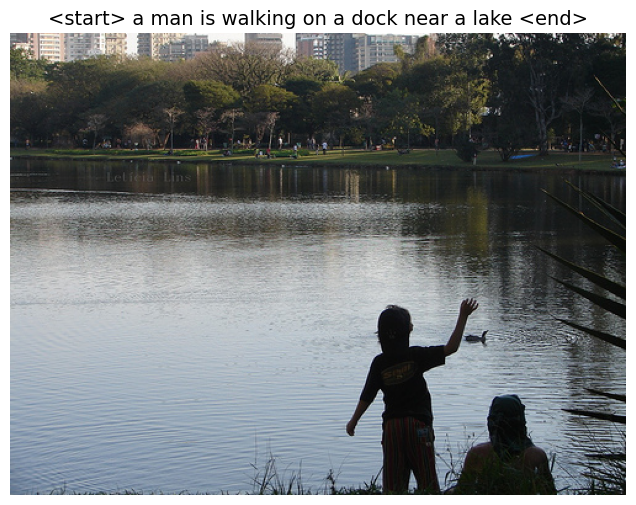

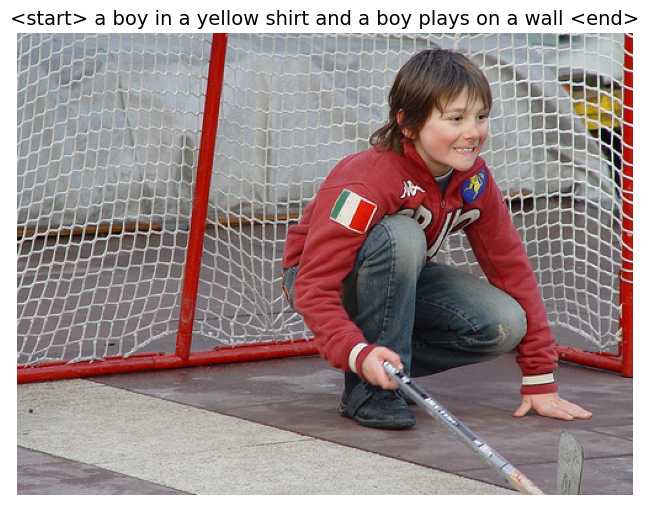

...

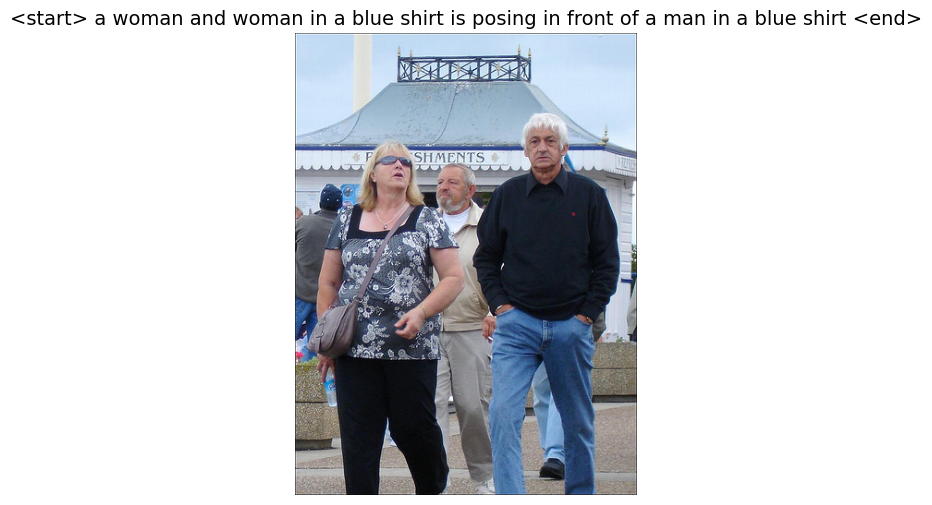

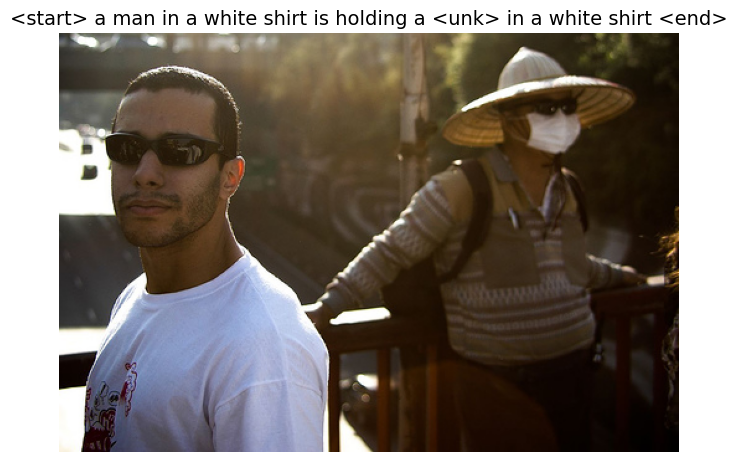

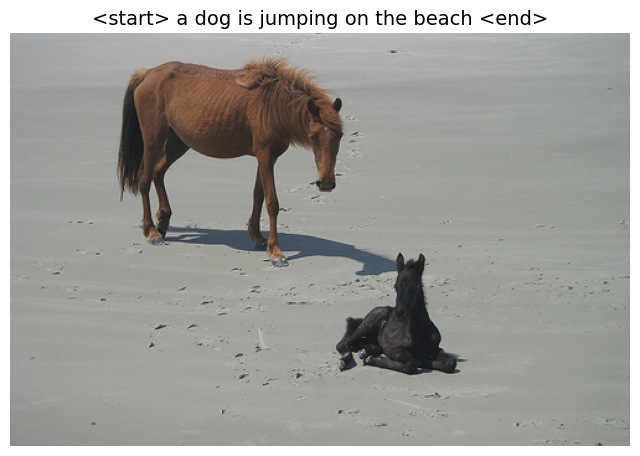

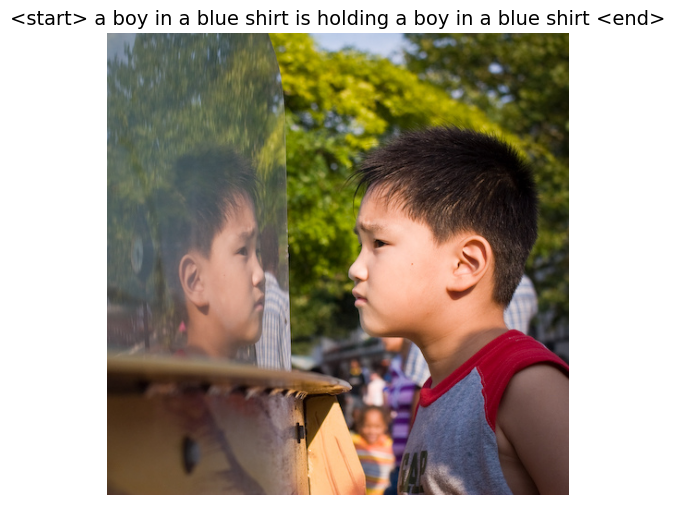

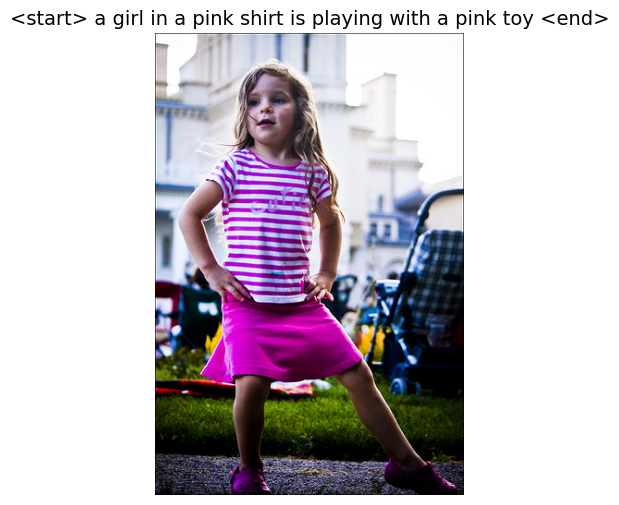

In [14]:
with open("submission.csv", 'r') as f:
    reader = csv.reader(f)
    for i,row in enumerate(reader):
        if i==20:
            break
        show_image_with_caption(f'Data/test/test/{row[0]}',row[1])  